# Binary cross-entropy data

In [2]:
import sys
import os
import numpy as np
from tsne import bh_sne

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})
matplotlib.rcParams['figure.figsize'] = (100.0, 100.0)

%matplotlib inline
from scipy.misc import imresize

sys.path.append('..')
from data import load_data

from lasagne import layers, nonlinearities, updates, objectives, init 
from lasagne.layers import get_output, get_output_shape, get_all_params
import theano.tensor as T
import theano
np.random.seed(247) # for reproducibility

Using gpu device 0: GeForce GTX 980 (CNMeM is disabled, CuDNN 4007)


In [3]:
name = 'MotifSimulation_binary'
datapath = '/home/peter/Data/SequenceMotif'
filepath = os.path.join(datapath, 'N=100000_S=200_M=10_G=20_data.pickle')
train, valid, test = load_data(name, filepath)
shape = (None, train[0].shape[1], train[0].shape[2], train[0].shape[3])
num_labels = 20

loading data from: /home/peter/Data/SequenceMotif/N=100000_S=200_M=10_G=20_data.pickle
loading train data
loading cross-validation data
loading test data


## Convolutional neural network

In [ ]:
# build model
input_var = T.tensor4('input')
target_var = T.dmatrix('target')

# input layer
l_in = layers.InputLayer(shape=shape, input_var=input_var)

# 1st convolutional layer 
l_conv1 = layers.Conv2DLayer(l_in, num_filters=50, filter_size=(8,1), W=init.GlorotUniform(), 
                                   b=init.Constant(0.05), nonlinearity=None)
l_norm1 = layers.BatchNormLayer(l_conv1)
l_nonlin1 = layers.ParametricRectifierLayer(l_norm1, alpha=init.Constant(0.25), shared_axes='auto')
l_pool1 = layers.MaxPool2DLayer(l_nonlin1, pool_size=(4,1))

# 2nd convolutional layer 
l_conv2 = layers.Conv2DLayer(l_pool1, num_filters=50, filter_size=(8,1), W=init.GlorotUniform(), 
                                   b=init.Constant(0.05), nonlinearity=None)
l_norm2 = layers.BatchNormLayer(l_conv2)
l_nonlin2 = layers.ParametricRectifierLayer(l_norm2, alpha=init.Constant(0.25), shared_axes='auto')
l_pool2 = layers.MaxPool2DLayer(l_nonlin2, pool_size=(4,1))

# 3rd dense layer 
l_dense4 = layers.DenseLayer(l_pool2,  num_units=100, W=init.GlorotUniform(), 
                             b=init.Constant(0.05), nonlinearity=None)
l_norm4 = layers.BatchNormLayer(l_dense4)
l_nonlin4 = layers.NonlinearityLayer(l_norm4, nonlinearity=nonlinearities.LeakyRectify())
l_drop4 = layers.DropoutLayer(l_nonlin4, p=0.5)

# output layer 
l_dense5 = layers.DenseLayer(l_drop4,  num_units=num_labels, W=init.GlorotUniform(), 
                             b=init.Constant(0.05), nonlinearity=None)
l_out = layers.NonlinearityLayer(l_dense5, nonlinearity=nonlinearities.sigmoid)

# setup loss for training
prediction = get_output(l_out)
train_loss = objectives.binary_crossentropy(prediction, target_var)
train_loss = train_loss.mean()

# setup loss for validation
valid_prediction = get_output(l_out, deterministic=True)
valid_loss = objectives.binary_crossentropy(valid_prediction, target_var)
valid_loss = valid_loss.mean()

# setup validation accuracy
valid_acc = T.mean(T.eq(T.round(valid_prediction), target_var), dtype=theano.config.floatX)

# setup adam optimizer
params = get_all_params(l_out, trainable=True)
update_op = updates.adam(train_loss, params, learning_rate=.0001)

# compile theano function
train_fn = theano.function([input_var, target_var], train_loss, updates=update_op, allow_input_downcast=True)
val_fn = theano.function([input_var, target_var], [valid_loss, valid_acc], allow_input_downcast=True)

In [ ]:
# setup mini-batch generator
def batch_generator(X, y, N):
    while True:
        idx = np.random.choice(len(y), N)
        yield X[idx].astype('float32'), y[idx].astype('float32')

# setup mini-batches of training and validation data
batch_size = 128
num_train_batches = len(train[0]) // batch_size
train_batches = batch_generator(train[0], train[1], batch_size)

num_valid_batches = len(valid[0]) // batch_size
valid_batches = batch_generator(valid[0], valid[1], batch_size)

# train network (for short time -- MNIST is quick to train)
n_epochs = 50
for e in range(n_epochs):
    print("epoch %d" % (e+1))
    ave_loss = 0
    for index in range(num_train_batches):
        X_batch, y_batch = next(train_batches)
        train_loss = train_fn(X_batch, y_batch)
        ave_loss += train_loss
    print("train: %f" % float(ave_loss/num_train_batches))

    ave_loss = 0
    ave_acc = 0
    for index in range(num_valid_batches):
        X_batch, y_batch = next(valid_batches)
        valid_loss, valid_acc = val_fn(X_batch, y_batch)
        ave_loss += valid_loss
        ave_acc += valid_acc
    print("valid: %f" % float(ave_loss/num_valid_batches))
    print("accuracy: %f" % float(ave_acc/num_valid_batches))

epoch 1


## Visualization of 1st layer

### Helper functions 

In [46]:
def fig_options(plt, options):
    if 'figsize' in options:
        fig = plt.gcf()
        fig.set_size_inches(options['figsize'][0], options['figsize'][1], forward=True)
    if 'ylim' in options:
        plt.ylim(options['ylim'][0],options['ylim'][1])
    if 'yticks' in options:
        plt.yticks(options['yticks'])
    if 'xticks' in options:
        plt.xticks(options['xticks'])
    if 'labelsize' in options:        
        ax = plt.gca()
        ax.tick_params(axis='x', labelsize=options['labelsize'])
        ax.tick_params(axis='y', labelsize=options['labelsize'])
    if 'axis' in options:
        plt.axis(options['axis'])
    if 'xlabel' in options:
        plt.xlabel(options['xlabel'], fontsize=options['fontsize'])
    if 'ylabel' in options:
        plt.ylabel(options['ylabel'], fontsize=options['fontsize'])
    if 'linewidth' in options:
        plt.rc('axes', linewidth=options['linewidth'])
        

def get_feature_maps(layer, X, batch_size=500):
    num_data = len(X)
    feature_maps = theano.function([input_var], layers.get_output(layer), allow_input_downcast=True)
    map_shape = get_output_shape(layer)

    # get feature maps in batches for speed
    num_batches = num_data // batch_size
    shape = list(map_shape)
    shape[0] = num_data
    
    fmaps = np.empty(tuple(shape))
    for i in range(num_batches):
        index = range(i*batch_size, (i+1)*batch_size)    
        fmaps[index] = feature_maps(X[index])

    # get the rest of the feature maps
    excess = num_data-num_batches*batch_size
    index = range(num_data-excess, num_data)    
    fmaps[index] = feature_maps(X[index])
    
    return fmaps


def subplot_grid(nrows, ncols):
    gs = mpl.gridspec.GridSpec(nrows, ncols)
    gs.update(wspace=0.2, hspace=0.2, left=0.1, right=0.2, bottom=0.1, top=0.2) 
    return gs


def get_class_activation(fmaps, y, batch_size=512):
    fmaps = np.squeeze(fmaps)
    mean_activation = []
    std_activation = []
    for i in range(y.shape[1]):
        index = np.where(y[:,i] == 1)[0]
        mean_activation.append(np.mean(fmaps[index], axis=0))
        std_activation.append(np.std(fmaps[index], axis=0))
    return np.array(mean_activation), np.array(std_activation)


def plot_mean_activations(mean_activation, options):
    num_labels = len(mean_activation)
    nrows = np.ceil(np.sqrt(num_labels)).astype(int)
    ncols = nrows

    plt.figure(figsize=(5,5))
    grid = subplot_grid(nrows, ncols)
    for i in range(num_labels):
        plt.subplot(grid[i])
        plt.plot(mean_activation[i].T)
        fig_options(plt, options)
    return plt

def get_weights(layer, convert_pwm=0):
    W =  np.squeeze(layer.W.get_value())
    W_norm = W
    if convert_pwm == 1:
        for i in range(len(W)):
            weights = np.exp(W[i])
            Z = np.sum(weights, axis=0)
            weights /= np.tile(Z, (W[i].shape[0],1))
            W_norm[i] = weights
    return W_norm


def plot_conv_weights(W, options):
    num_filters = W.shape[0]
    nrows = np.ceil(np.sqrt(num_filters)).astype(int)
    ncols = nrows
    plt.figure(figsize=(3,3))
    grid = subplot_grid(nrows, ncols)
    for i in range(num_filters):
        plt.subplot(grid[i])
        plt.imshow(W[i], cmap='hot_r', interpolation='nearest')
        fig_options(plt, options)
    return plt

    
def plot_tsne_binary(x, y, labels, options):
    num_labels = labels.shape[1]
    colormap = cm.gist_rainbow(np.linspace(0, 255, num_labels).astype(int))
    plt.figure()
    for i in range(num_labels):
        index = np.where(labels[:,i] == 1)[0]
        plt.scatter(x[index], y[index], facecolor=colormap[i,:], edgecolor='none')        
    fig_options(plt, options)
    return plt


def plot_tsne_binary_all(x, y, labels, options):
    plt.figure()
    index = np.where(labels == 0)[0]
    plt.scatter(x[index], y[index], facecolor='c', edgecolor='none')
    index = np.where(labels == 1)[0]
    plt.scatter(x[index], y[index], facecolor='r', edgecolor='none')
    fig_options(plt, options)
    return plt


### 1st layer weights

In [1]:
W = get_weights(l_conv1, convert_pwm=1)

options = {'figsize':(50,50), 'axis':'off'}
plt = plot_conv_weights(W, options)
plt.savefig('binary_layer1_weights.tif', format='tif', dpi=1000)

NameError: name 'get_weights' is not defined

### visualize activations of layer 1

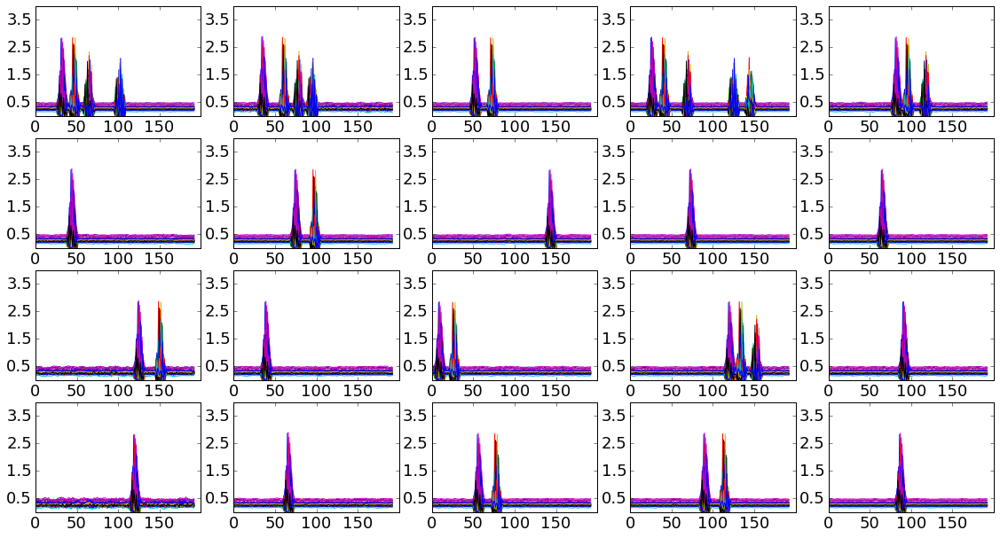

In [15]:
fmaps = get_feature_maps(l_nonlin1, train[0])
mean_activation, std_activation = get_class_activation(fmaps, train[1])

options = { 'ylim': [0, 4],
            'xticks': [0, 50, 100, 150],
            'yticks': [0.5, 1.5, 2.5, 3.5], 
            'labelsize': 18,
            'figsize': (150,100)}
plt = plot_mean_activations(mean_activation, options)
plt.savefig('binary_l1_activation.eps', format='eps', dpi=1000)    

### layer 1 tSNE on max-pooled feature maps

In [16]:
fmaps = get_feature_maps(l_pool1, train[0], batch_size=512)
fmaps_flat = fmaps.reshape((len(fmaps),-1))
fmaps_flat.shape

(69999, 2400)

In [17]:
# perform t-SNE embedding
vis_cnn = bh_sne(fmaps_flat)

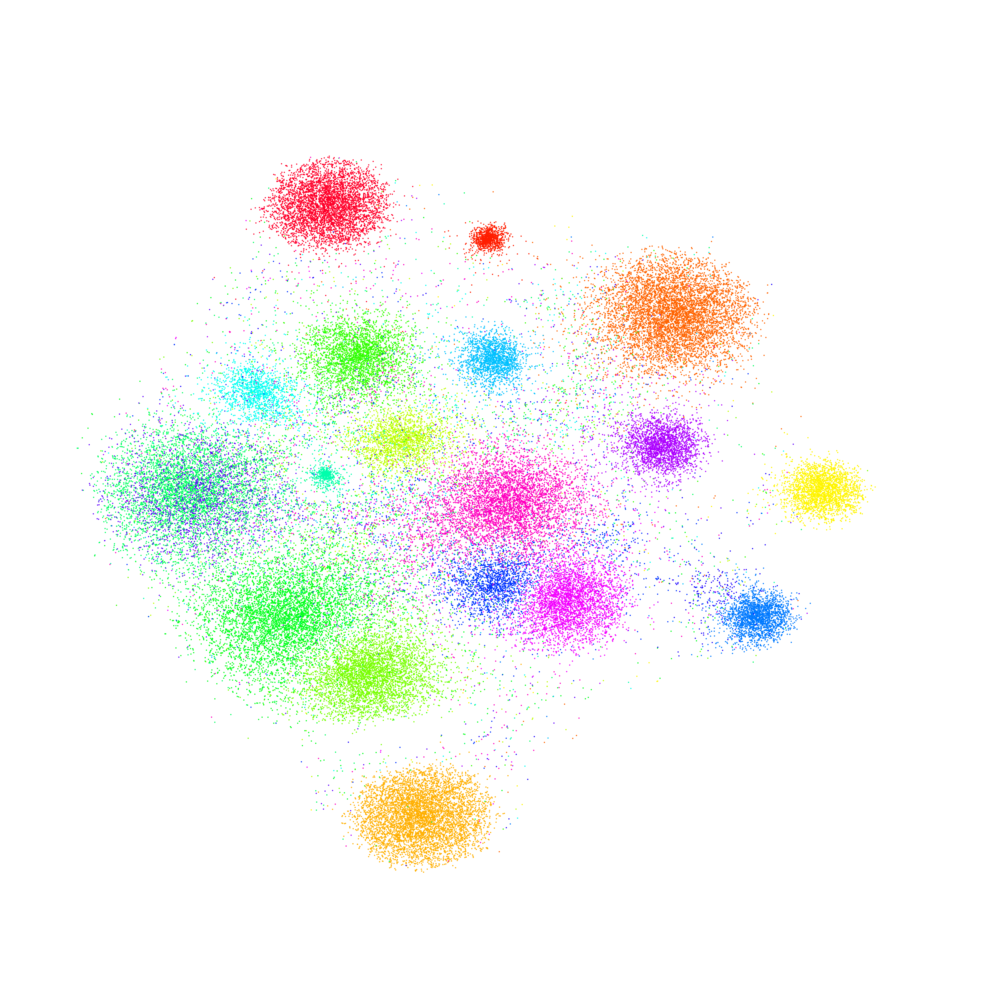

In [33]:
options = {'figsize':(50,50), 'axis':'off'}
plt = plot_tsne_binary(vis_cnn[:,0], vis_cnn[:,1], train[1], options)
plt.savefig('binary_tsne_layer1.eps', format='eps', dpi=1000)

## Visualization of 2nd layer

### layer 2 weights

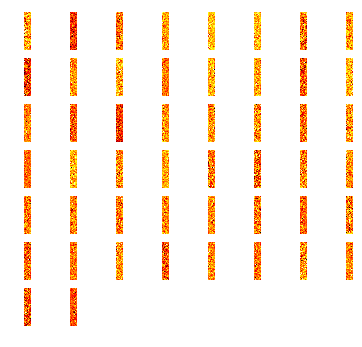

In [19]:
W = get_weights(l_conv2, convert_pwm=0)
options = {'figsize':(50,50), 'axis':'off'}
plt = plot_conv_weights(W, options)
plt.savefig('binary_layer2_weights.eps', format='eps', dpi=1000)

### layer 2 activations

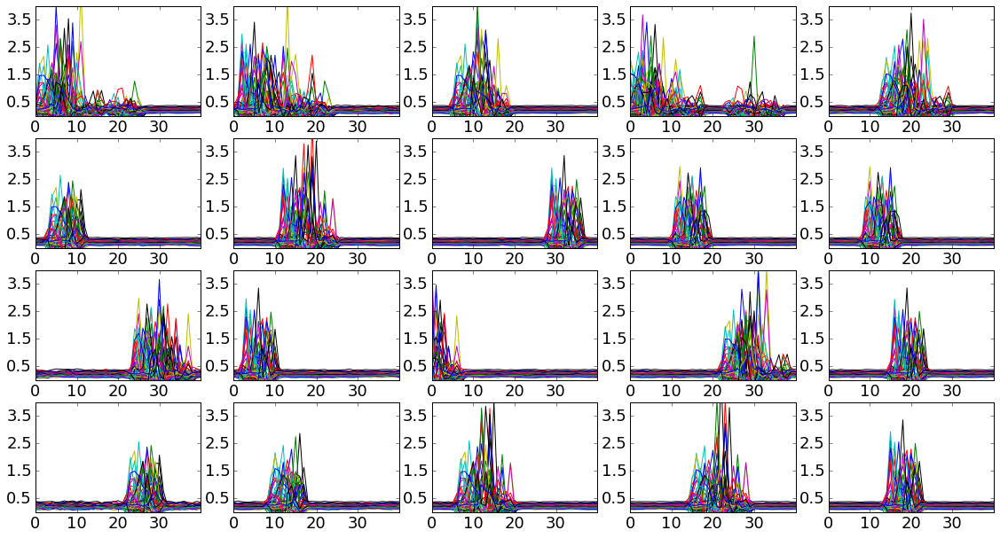

In [22]:
fmaps = get_feature_maps(l_nonlin2, train[0])
mean_activation, std_activation = get_class_activation(fmaps, train[1])

options = { 'ylim': [0, 4],
            'xticks': [0, 10, 20, 30],
            'yticks': [0.5, 1.5, 2.5, 3.5], 
            'labelsize': 18,
            'figsize': (150,100)}
plt = plot_mean_activations(mean_activation, options)
plt.savefig('binary_l2_activation.eps', format='eps', dpi=1000)    

### layer 2 tSNE on max-pooled feature maps

In [23]:
fmaps = get_feature_maps(l_pool2, train[0], batch_size=512)
fmaps_flat = fmaps.reshape((len(fmaps),-1))
fmaps_flat.shape

(69999, 500)

In [24]:
# perform t-SNE embedding
vis_cnn2 = bh_sne(fmaps_flat)

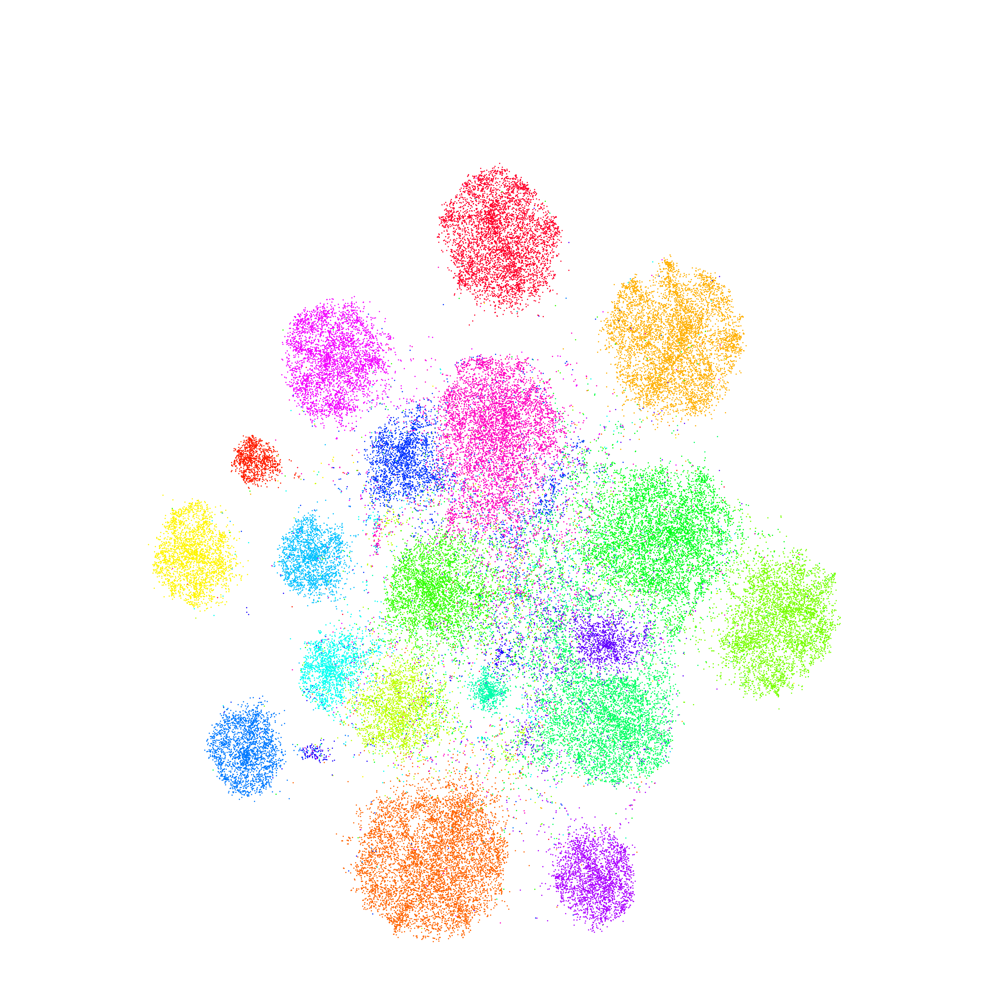

In [31]:
options = {'figsize':(50,50), 'axis':'off'}
plt = plot_tsne_binary(vis_cnn2[:,0], vis_cnn2[:,1], train[1], options)
plt.savefig('binary_tsne_layer2.eps', format='eps', dpi=1000)

## Dense layer visualization

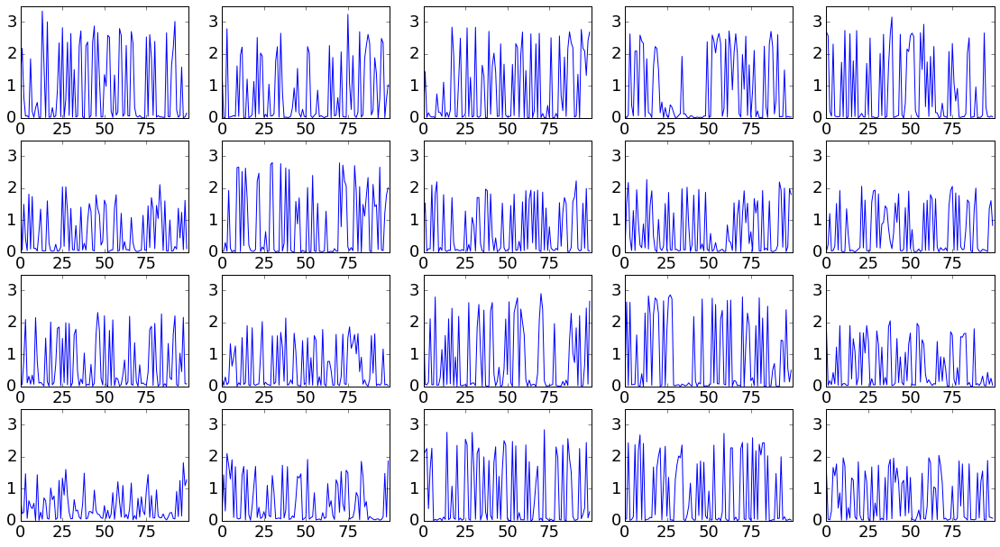

In [26]:
fmaps = get_feature_maps(l_nonlin4, train[0])
mean_activation, std_activation = get_class_activation(fmaps, train[1])
options = { 'ylim': [0, 3.5],
            'xticks': [0, 25, 50, 75],
            'yticks': [0, 1, 2, 3], 
            'labelsize': 18,
            'figsize': (150,100)}
plt = plot_mean_activations(mean_activation, options)
plt.savefig('binary_l3_activation.eps', format='eps', dpi=1000)   

In [28]:
# perform t-SNE embedding
vis_dense = bh_sne(fmaps_flat)

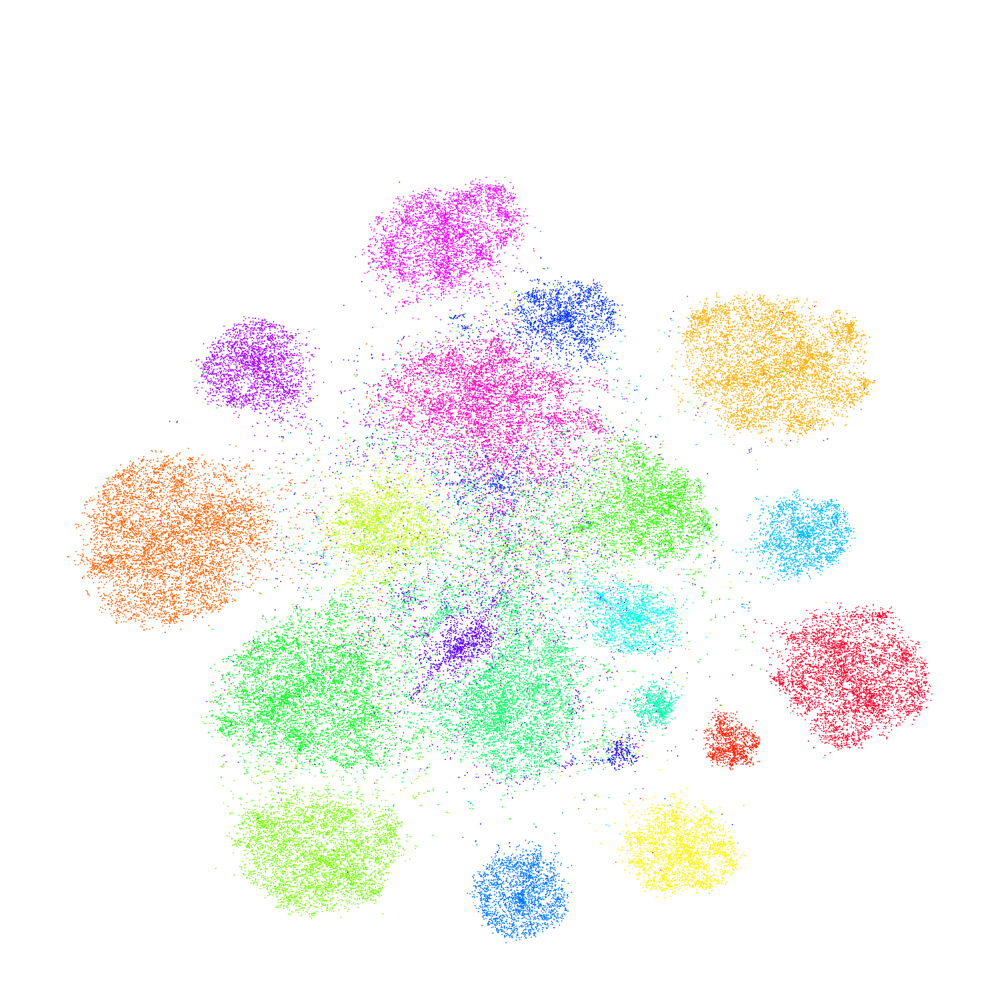

In [30]:
options = {'figsize':(50,50), 'axis':'off'}
plt = plot_tsne_binary(vis_dense[:,0], vis_dense[:,1], train[1], options)
plt.savefig('binary_tsne_layer3.eps', format='eps', dpi=1000)